In [55]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

In [56]:
# importing EMPLOYEE PROMOTION STARTUP CASE STUDY DATA
df=pd.read_csv("employee_promotion.csv")

In [57]:
df

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,0,49.0,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,60.0,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,50.0,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,50.0,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,73.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,78.0,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,56.0,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,0,79.0,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,NaN,0


### In this data we want to predict whether the employee got promoted or not ?

In [58]:
# shape of the data
df.shape

(54808, 13)

In [59]:
# size of the dataset
df.size

712504

### Cleaning and Exploratory Data Analysis is as follows :

In [60]:
df.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,52248.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.023172,63.712238,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.150450,13.521910,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,0.000000,77.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,99.000000,1.000000


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  awards_won            54808 non-null  int64  
 11  avg_training_score    52248 non-null  float64
 12  is_promoted           54808 non-null  int64  
dtypes: float64(2), int64(6), object(5)
memory usage: 5.4+ MB


### knowing about null values :

In [62]:
df.isnull().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
awards_won                 0
avg_training_score      2560
is_promoted                0
dtype: int64

In [63]:
df.interpolate(inplace=True)

In [64]:
df.isnull().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating       0
length_of_service          0
awards_won                 0
avg_training_score         0
is_promoted                0
dtype: int64

In [65]:
df.dropna(inplace=True)

In [66]:
df.isnull().sum()

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
awards_won              0
avg_training_score      0
is_promoted             0
dtype: int64

### Education status - Awards won

In [67]:
px.pie(df,values='awards_won',names='education',template='plotly_dark')

### Number of employess and their education status - Promotion

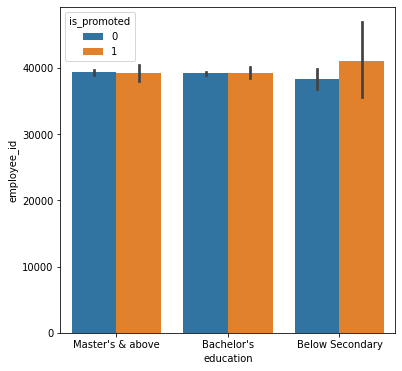

In [68]:
plt.figure(figsize=(6,6))
sns.barplot(x='education',y='employee_id',hue='is_promoted',data=df)
plt.show()

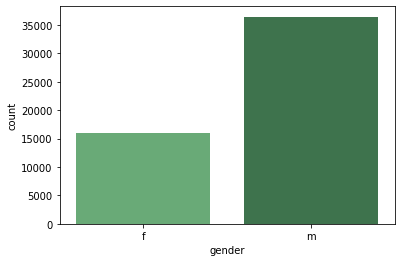

In [69]:
sns.countplot(x='gender',data=df,palette='Greens_d')

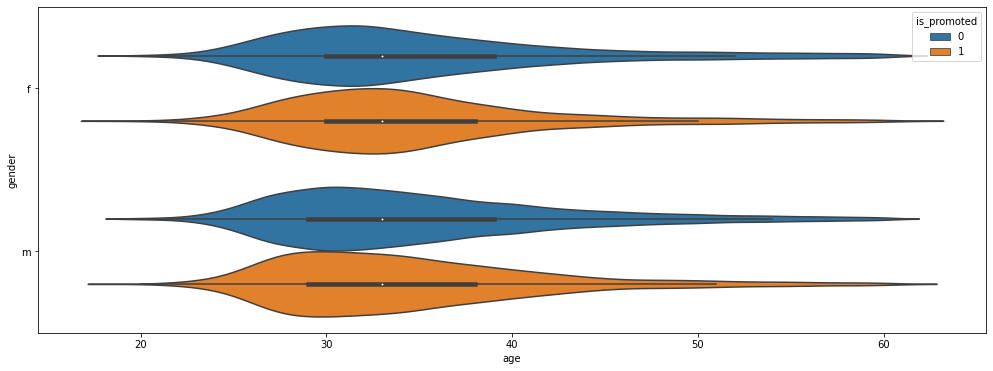

In [70]:
plt.figure(figsize=(17,6))
sns.violinplot(x='age',y='gender',hue='is_promoted',data=df)
plt.show()

### Departments

In [71]:
px.violin(df,df['department'],template='plotly_dark')

### How length of service varies with age among Males and females.

In [72]:
px.box(df,df['age'],df['length_of_service'],color='gender',title='Length of Service',template='plotly_dark')

### Department wise who are promoted 

In [73]:
px.pie(df,values='is_promoted',names='department',template = 'plotly_dark')

## Awards won by Department wise

In [74]:
px.violin(df,df['department'],df['awards_won'],color='department',title='Departments - Awards_won',template='plotly_dark')

## Unique values in the data

In [75]:
col=['department','region','recruitment_channel','education']

for i in col:
    print(i)
    print(df[i].unique())
    print(df[i].nunique())
    print()

department
['Sales & Marketing' 'Operations' 'Technology' 'Analytics' 'R&D'
 'Procurement' 'Finance' 'HR' 'Legal']
9

region
['region_7' 'region_22' 'region_19' 'region_23' 'region_26' 'region_2'
 'region_20' 'region_34' 'region_1' 'region_4' 'region_29' 'region_31'
 'region_15' 'region_14' 'region_11' 'region_5' 'region_28' 'region_17'
 'region_13' 'region_16' 'region_25' 'region_10' 'region_27' 'region_30'
 'region_12' 'region_21' 'region_8' 'region_32' 'region_6' 'region_33'
 'region_24' 'region_3' 'region_9' 'region_18']
34

recruitment_channel
['sourcing' 'other' 'referred']
3

education
["Master's & above" "Bachelor's" 'Below Secondary']
3



## Correlation of the Data

In [76]:
df.corr()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
employee_id,1.000000,-0.004701,0.000007,0.005071,0.000742,0.007586,0.000612,0.000751
no_of_trainings,-0.004701,1.000000,-0.082601,-0.060518,-0.057845,-0.007659,0.041749,-0.025389
age,0.000007,-0.082601,1.000000,0.005522,0.652379,-0.008209,-0.060172,-0.018920
previous_year_rating,0.005071,-0.060518,0.005522,1.000000,-0.000325,0.026564,0.064670,0.149112
length_of_service,0.000742,-0.057845,0.652379,-0.000325,1.000000,-0.040140,-0.045687,-0.012167
awards_won,0.007586,-0.007659,-0.008209,0.026564,-0.040140,1.000000,0.072156,0.195451
avg_training_score,0.000612,0.041749,-0.060172,0.064670,-0.045687,0.072156,1.000000,0.178463
is_promoted,0.000751,-0.025389,-0.018920,0.149112,-0.012167,0.195451,0.178463,1.000000


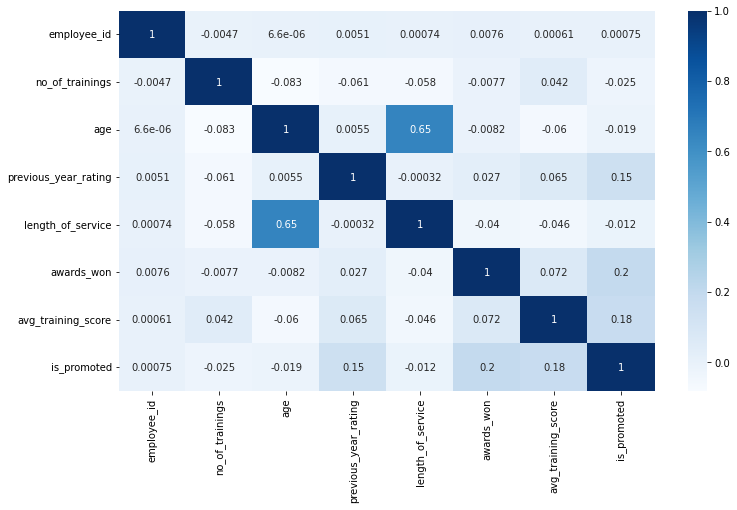

In [77]:
plt.figure(figsize=(12,7))
sns.heatmap(df.corr(),annot=True,cmap='Blues')
plt.show()

## Prediction : 

In [78]:
df.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,0,49.0,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,60.0,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,50.0,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,50.0,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,73.0,0


In [79]:
df.drop('employee_id',axis=1,inplace=True)
df.drop('region',axis=1,inplace=True)

In [95]:
df.head()

,department,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,7,2,0,2,1,35,5.0,8,0,49.0,0
1,4,0,1,0,1,30,5.0,4,0,60.0,0
2,7,0,1,2,1,34,3.0,7,0,50.0,0
3,7,0,1,0,2,39,1.0,10,0,50.0,0
4,8,0,1,0,1,45,3.0,2,0,73.0,0


### Using LabelEncoder To transform the data 

In [81]:
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
for i in df.columns:
    if df[i].dtype == 'object':
        df[i]=l.fit_transform(df[i])
        
# The 'object' data type columns are transformed as follows

In [82]:
df.head()

,department,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,7,2,0,2,1,35,5.0,8,0,49.0,0
1,4,0,1,0,1,30,5.0,4,0,60.0,0
2,7,0,1,2,1,34,3.0,7,0,50.0,0
3,7,0,1,0,2,39,1.0,10,0,50.0,0
4,8,0,1,0,1,45,3.0,2,0,73.0,0


### Splitting the data for training and testing

In [83]:
x=df.drop('is_promoted',axis=1)
y=df['is_promoted']

In [84]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.30)

In [85]:
from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler(feature_range=(0,1))
xtrain=mms.fit_transform(xtrain)
xtest=mms.fit_transform(xtest)
xtrain=pd.DataFrame(xtrain)
xtest=pd.DataFrame(xtest)

In [86]:
R= {'Model':[],'Accuracy':[],'Recall':[],'Precision':[],'F1':[]}

In [87]:
Results=pd.DataFrame(R)
Results.head()

,Model,Accuracy,Recall,Precision,F1


### Importing Machine Learning Algorithms
### Logistic, Decision tree, random forest

In [88]:
# from sklearn.linear_model import LogisticRegression
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.ensemble import RandomForestClassifier

# lr=LogisticRegression()
# dc=DecisionTreeClassifier()
# rf=RandomForestClassifier()

# model=[lr,dc,rf]

# for models in model:
#     models.fit(xtrain,ytrain)
    
#     ypred=models.predict(xtest)
    
    
#     print('Model :',models)
#     print('-----------------------------------------------------------------------------------------------------------------------')
#     from sklearn.metrics import confusion_matrix
#     from sklearn.metrics import classification_report
#     from sklearn.metrics import accuracy_score,recall_score,f1_score,precision_score
    
#     print('confusion matrix :',confusion_matrix(ytest,ypred))
#     print('classification report:',classification_report(ytest,ypred))
#     print('accuracy :',round(accuracy_score(ytest,ypred),2))
#     print('precision :',round(precision_score(ytest,ypred),2))
#     print('recall :',round(recall_score(ytest,ypred),2))
#     print('f1 :',round(f1_score(ytest,ypred),2))
#     print()
#     R={'Model':models,
#              'Accuracy':round(accuracy_score(ytest,ypred),2),
#              'Recall':round(recall_score(ytest,ypred),2),
#              'Precision':round(precision_score(ytest,ypred),2),
#              'F1':round(f1_score(ytest,ypred),2)
#             }
#     Results=Results.append(R,ignore_index=True)

### Printing the results of three algorithms :

In [89]:
Results

,Model,Accuracy,Recall,Precision,F1


# Save and load model

In [90]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
import pickle


In [91]:
rf.fit(xtrain,ytrain)

RandomForestClassifier()

In [92]:
filename = "model.pickle"

# save model
pickle.dump(rf, open(filename, "wb"))

# load model
loaded_model = pickle.load(open(filename, "rb"))

# you can use loaded model to compute predictions
y_predicted = loaded_model.predict(xtest)

In [93]:
y_predicted

array([1, 0, 0, ..., 0, 0, 0])

In [94]:
xtrain.to_csv('xtest.csv')

# **THANK YOU**